In [1]:
%load_ext autoreload
%autoreload 2

import os 
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
from lib.config import config
from transformer_lens import HookedTransformer
from lib.train import init_model, evaluate
from lib.data import get_train_test_loaders, detect_carry
import torch as t

config['ckpt_name'] = 'ckpt_4750.pt'
config['out_dir'] = 'out/baseline/gpt-nano-reverse-n_digit-4-trial-3'
config['resume'] = True
config['wandb_log'] = False
config['device'] = 'cuda:0'
config['num_test'] = 1000
config['use_hookedtransformer'] = True
model, it, best_val_acc, ckpt, encode, decode, vocab_size = init_model(config)
model: HookedTransformer
model.eval()
print(it, config['n_digit'])
train_dataloader, test_dataloaders = get_train_test_loaders(encode, config)
# test_dataloaders[0].dataset.prompt_pad_length = 30
test_dataloader = test_dataloaders[0]
evaluate(model, it, [test_dataloader], encode, decode, config=config, verbose=True)
tds = [d for d in test_dataloader.dataset]
test_dataset = test_dataloader.collate_fn(tds)
carries = t.tensor([sum([c[i]*2**i for i in range(len(c))]) for c in test_dataset['carries'].cpu().numpy()])
eq_pos = test_dataloader.dataset.prompt_pad_length - 1
pad_token_id = test_dataloader.dataset.pad_token_id


all the unique characters: 
 !"#$%&'()*+,-./0123456789:;<=>?@ABCDEFGHIJKLMNOPQRSTUVWXYZ[\]^_`abcdefghijklmnopqrstuvwxyz{|}~
vocab size: 96
Moving model to device:  cuda:0
4750 4


  0%|          | 0/1 [00:00<?, ?it/s]

inp: '##$9769+41=' out: '1699$' ans: '0189$'
inp: '#$7212+585=' out: '7987$' ans: '7977$'
inp: '#$6910+498=' out: '8057$' ans: '8047$'
inp: '#$9455+995=' out: '04401$' ans: '05401$'
inp: '#$6601+968=' out: '9677$' ans: '9657$'
inp: '##$6960+60=' out: '6995$' ans: '0207$'
inp: '#$9195+956=' out: '14101$' ans: '15101$'
inp: '#$9702+295=' out: '79001$' ans: '7999$'
inp: '###$9791+9=' out: '1799$' ans: '0089$'
inp: '#$3496+603=' out: '9804$' ans: '9904$'
inp: '#$7649+820=' out: '9548$' ans: '9648$'
inp: '#$9154+426=' out: '0949$' ans: '0859$'
inp: '#$9011+248=' out: '9639$' ans: '9529$'
inp: '#$5849+710=' out: '9475$' ans: '9556$'
inp: '#$8575+489=' out: '4799$' ans: '4609$'
inp: '##$7988+21=' out: '0708$' ans: '9008$'
inp: '#$6730+429=' out: '9417$' ans: '9517$'
inp: '#$2101+648=' out: '9482$' ans: '9472$'
inp: '###$0+8939=' out: '9399$' ans: '9398$'
inp: '#$6441+475=' out: '6195$' ans: '6196$'
inp: '#$7759+418=' out: '7728$' ans: '7718$'
inp: '#$9383+607=' out: '0989$' ans: '0999$'
inp: 

In [39]:
for line in test_dataset['line'][:10]:
    print(repr(decode(line.cpu().numpy())))

'$6707+9203=01951$\n'
'$5822+2729=1558$\n#'
'$9719+3561=08231$\n'
'#$9595+388=3899$\n#'
'$9658+1043=10701$\n'
'$1429+3676=5015$\n#'
'$5808+5392=00211$\n'
'##$65+9401=6649$\n#'
'$9228+3360=88521$\n'
'$4820+3460=0828$\n#'


In [6]:
from transformer_lens.utils import get_attention_mask
def get_mask(tokens, pad_token_id):
    return get_attention_mask(None, tokens=tokens, prepend_bos=False, pad_token_id=pad_token_id, bos_token_id=None, padding_side='left').to(config['device'])

# example_text = decode(test_dataset['line'][0].cpu().numpy())
example_text = '$15140+84771=11999' #65319642
example_toks = t.tensor(encode(example_text)).unsqueeze(0).to(config['device'])
a = int(example_text.replace('#', '').replace('$', '').split('=')[0].split('+')[0])
b = int(example_text.replace('#', '').replace('$', '').split('=')[0].split('+')[1])
_, _, ex_carries = detect_carry(a, b, ary=10)
print(ex_carries)
print(list(str(a + b)[::-1]))

model.eval()
attention_mask = get_mask(example_toks, pad_token_id)
print(attention_mask)
logits, cache = model.run_with_cache(example_toks, attention_mask=attention_mask, return_type='logits', remove_batch_dim=True)
# with t.inference_mode():
#     logits = model(example_toks, attention_mask=attention_mask, return_type='logits')
print(logits.shape)
print(decode(example_toks.squeeze().cpu().numpy()))
print(decode(logits.argmax(-1).squeeze().cpu().numpy()))

[0, 1, 0, 0, 0]
['1', '1', '9', '9', '9']
tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]],
       device='cuda:0')
torch.Size([1, 18, 96])
$15140+84771=11999
17185+95775=11999$


In [4]:
from circuitsvis import circuitsvis as cv
for layer in range(model.cfg.n_layers):
    pattern = cache['pattern', layer]
    display(cv.attention.attention_heads(pattern, tokens=list(example_text)))


Text(0.5, 0.98, 'Similarily of attention patterns across carry positions, for every head in every layer')

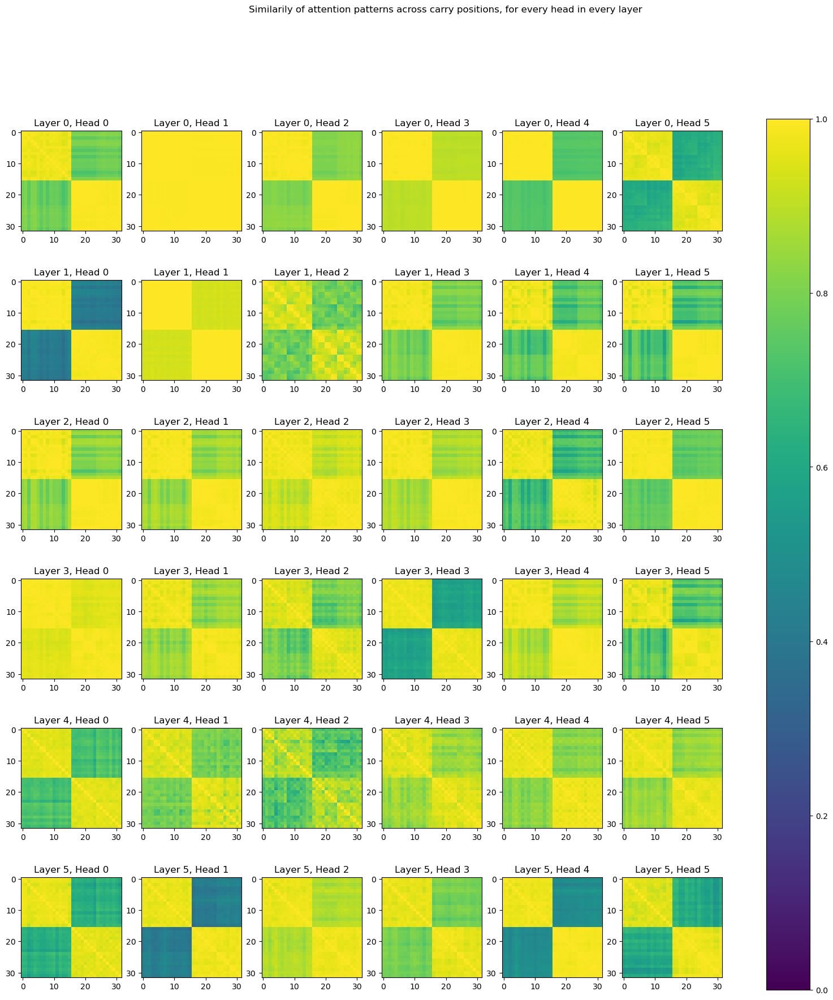

In [8]:
from transformer_lens.utils import get_act_name
from matplotlib import pyplot as plt
import random

f, axs = plt.subplots(config['n_layer'], config['n_head'], figsize=(20, 20))

for target_layer in range(config['n_layer']):
    for target_head in range(config['n_head']):      
        c = 0
        all_patterns = []
        carry_pos_arr = list(range(2**config['n_digit']))
        for carry_pos in carry_pos_arr: 
            # c = carry_pos
            # target_carries = test_dataset['carries'][c]
            test_input = test_dataset['line'][(carries == carry_pos)]
            # test_input = test_dataset['line'][carry_pos::2**config['n_digit']] # random baseline
            # test_input = test_dataset['line'][test_dataset['carries'][:, carry_pos] == 1][:128]
            # test_input = test_dataset['line'][np.random.choice(len(test_dataset['line']), 128)]
            attention_mask = get_mask(test_input, pad_token_id)
            logits, cache = model.run_with_cache(test_input, attention_mask=attention_mask, return_type='logits', names_filter=get_act_name('pattern', target_layer))
            cache.to('cpu')
            patterns = cache['pattern', target_layer][:, target_head]
            # toks = ['x'] * test_dataloader.dataset.prompt_pad_length + target_carries.int().tolist() + ['x'] * 3
            # toks = decode(test_input[0].cpu().numpy())
            # print(patterns.shape)
            # display(cv.attention.attention_pattern(list(map(str, toks)), patterns.mean(0)))
            patterns = patterns[:, eq_pos:, :]
            all_patterns.append(patterns.mean(0) / t.norm(patterns.mean(0)))
            # axs[carry_pos].imshow(patterns.mean(0).cpu().numpy())
            # axs[carry_pos].set_xticks(range(len(toks)), toks)
            # axs[carry_pos].set_yticks(range(len(toks)), toks)

        all_patterns = t.stack(all_patterns)
        gram = t.einsum('aik,bik->ab', all_patterns, all_patterns)
        p = axs[target_layer, target_head].imshow(gram.cpu().numpy(), vmax=1, vmin=0)
        axs[target_layer, target_head].set_title(f'Layer {target_layer}, Head {target_head}')

plt.colorbar(p, ax=axs)
plt.suptitle('Similarily of attention patterns across carry positions, for every head in every layer')



'$19799+98461=062811$\n'


IndexError: index 4 is out of bounds for axis 0 with size 4

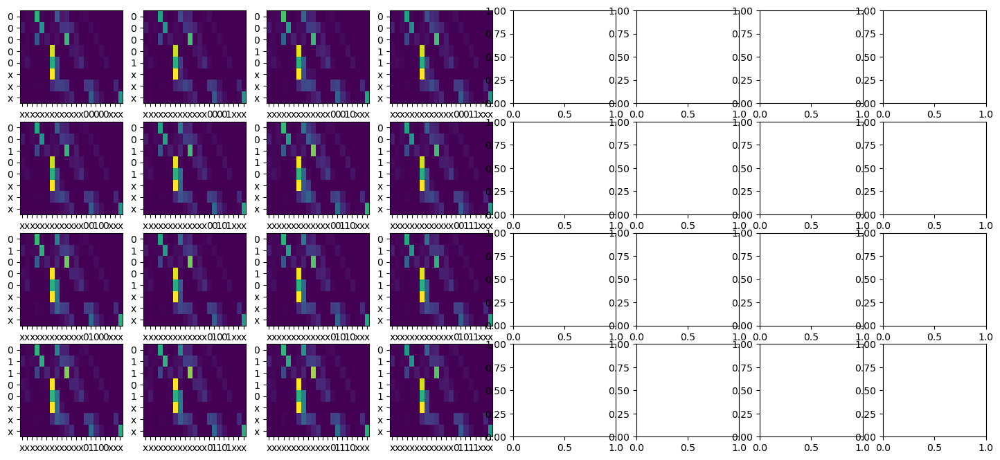

In [9]:
f, axs = plt.subplots(4, 2**config['n_digit']// 4, figsize=(4*4.5, 4 * 2))
target_layer = 0
target_head = 2
c = 0
all_patterns = []
print(repr(decode(test_input[0].cpu().numpy())))
for carry_pos in range(2 ** config['n_digit']):
    # c = 2**carry_pos
    # target_carries = test_dataset['carries'][c]
    # test_input = test_dataset['line'][test_dataset['carries'][:, carry_pos] == 1][:128]
    test_input = test_dataset['line'][carries == carry_pos]
    logits, cache = model.run_with_cache(test_input, attention_mask=None, return_type='logits', names_filter=get_act_name('pattern', target_layer), pad_token_id=pad_token_id)
    cache.to('cpu')
    patterns = cache['pattern', target_layer][:, target_head]
    # toks = ['x'] * (eq_pos+1) + target_carries.int().tolist() + ['x'] * 3
    toks = 'x' * (eq_pos+1) + bin(carry_pos)[2:].zfill(config['n_digit']) + 'x' * 3
    # toks = decode(test_input[0].cpu().numpy())
    # print(patterns.shape)
    patterns = patterns[:, eq_pos+1:, :]
    # display(cv.attention.attention_pattern(list(map(str, toks)), patterns.mean(0)))
    all_patterns.append(patterns.mean(0) / t.norm(patterns.mean(0)))
    axs[carry_pos // 4, carry_pos % 4].imshow(patterns.mean(0).cpu().numpy(), aspect='auto')
    axs[carry_pos // 4, carry_pos % 4].set_xticks(range(len(toks)), toks)
    axs[carry_pos // 4, carry_pos % 4].set_yticks(range(len(toks)-eq_pos-1), toks[eq_pos+1:])

plt.suptitle(f'Attention patterns for different carry scenarios, layer {target_layer}, head {target_head}')

In [10]:
from collections import defaultdict
from transformer_lens import ActivationCache
from tqdm import tqdm

cache_dict = {}
with t.no_grad():
    for bid, _ in tqdm(enumerate(range(config['num_test'] // config['eval_batch_size']+1))):
        batch = test_dataloader.collate_fn(tds[bid * config['eval_batch_size']:(bid + 1) * config['eval_batch_size']])
        test_input = batch['line'].to(config['device'])
        logits, cache = model.run_with_cache(test_input, attention_mask=None, return_type='logits', pad_token_id=pad_token_id)
        cache.to('cpu')
        for key, value in cache.items():
            if key not in cache_dict:
                cache_dict[key] = [value]
            else:
                cache_dict[key] += [value]

for key, value in cache_dict.items():
    cache_dict[key] = t.cat(value, dim=0)

cache = ActivationCache(cache_dict, model)
print(cache['resid_post', 0].shape)


0it [00:00, ?it/s]

1it [00:01,  1.26s/it]


torch.Size([1000, 21, 384])


torch.Size([256, 21])


/opt/conda/lib/python3.11/site-packages/torch/_inductor/compile_fx.py:135: UserWarning: TensorFloat32 tensor cores for float32 matrix multiplication available but not enabled. Consider setting `torch.set_float32_matmul_precision('high')` for better performance.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/torch/overrides.py:110: UserWarning: 'has_cuda' is deprecated, please use 'torch.backends.cuda.is_built()'
  torch.has_cuda,
/opt/conda/lib/python3.11/site-packages/torch/overrides.py:111: UserWarning: 'has_cudnn' is deprecated, please use 'torch.backends.cudnn.is_available()'
  torch.has_cudnn,
/opt/conda/lib/python3.11/site-packages/torch/overrides.py:117: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  torch.has_mps,
/opt/conda/lib/python3.11/site-packages/torch/overrides.py:118: UserWarning: 'has_mkldnn' is deprecated, please use 'torch.backends.mkldnn.is_available()'
  torch.has_mkldnn,


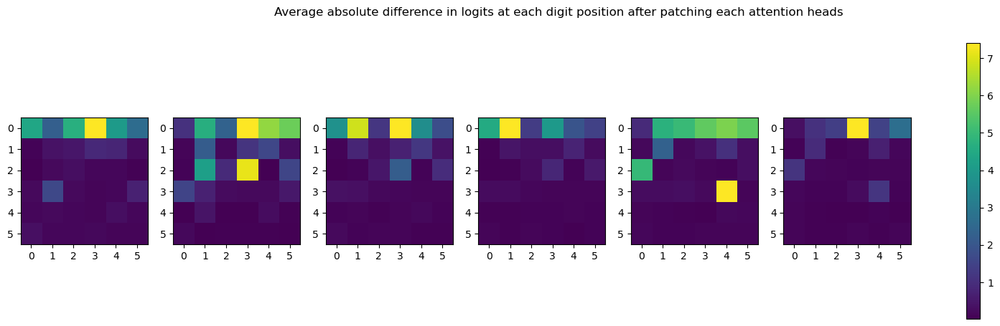

In [11]:
from functools import partial

device = config['device']

line_start = test_dataloader.dataset.prompt_pad_length-1
line_len = len(test_dataset['line'][0])

def patch_attn_head(activation, hook, head, layer, cache):
    # activation[:, :, head] = cache[hook.name][:, :, head].mean(0)
    activation[:, :, head] = 0
    return activation

scores = t.zeros(config['n_layer'], config['n_head'], config['n_digit'] + 1)
data_idx = range(256)
# data_idx = carries == 255
test_input = test_dataset['line'][data_idx]
print(test_input.shape)
with t.no_grad():
    old_logits = model(test_input.to(device), return_type='logits', pad_token_id=pad_token_id)
    for layer in range(model.cfg.n_layers):
        for head in range(model.cfg.n_heads):
            hook_fn = partial(patch_attn_head, head=head, layer=layer, cache=cache)
            model.eval()
            model.remove_all_hook_fns()
            new_logits = model.run_with_hooks(test_input.to(device), fwd_hooks=[(get_act_name('z', layer), hook_fn)], return_type='logits', pad_token_id=pad_token_id)
            scores[layer, head, :] = (new_logits.detach().cpu() - old_logits.detach().cpu())[:, eq_pos:eq_pos+config['n_digit']+1].abs().mean(0).mean(1)

f, axs = plt.subplots(1, config['n_digit']+1, figsize=(20, 5))
for i in range(config['n_digit'] + 1):
    p = axs[i].imshow(scores[:, :, i])
    axs[i].set_xticks(range(config['n_layer']), range(config['n_layer']))
    axs[i].set_yticks(range(config['n_head']), range(config['n_head']))

plt.suptitle('Average absolute difference in logits at each digit position after patching each attention heads')
plt.colorbar(p, ax=axs)


In [ ]:
# Length generalization

# from matplotlib import pyplot as plt

# val_accs = []
# n_digits = list(range(1, 20))
# for n_digit in n_digits:
#     config['n_digit'] = n_digit
#     config['wandb_log'] = False
#     _, test_dataloader = get_train_test_loaders(config)
#     val_acc = evaluate(model, 0, test_dataloader, pad_token_id, verbose=False)
#     val_accs.append(val_acc)

# plt.plot(n_digits, val_accs)


In [12]:
from collections import defaultdict

# plus_token = encode('+')[0]
# eq_token = encode('=')[0]
# plus_pos = [t.where(test_input == plus_token)[0] for test_input in test_dataset['line']]
# plus_pos = t.tensor(plus_pos)
# eq_pos = [t.where(test_input == eq_token)[0] for test_input in test_dataset['line']]
# eq_pos = t.tensor(eq_pos)
# print(test_dataloader.dataset.pad_length)

carry_idx_by_pos = defaultdict(list)
for i in range(len(carries)):
    car = carries[i]
    carry_idx_by_pos[car].append(i)

print(len(set(carries.cpu().numpy())))


32


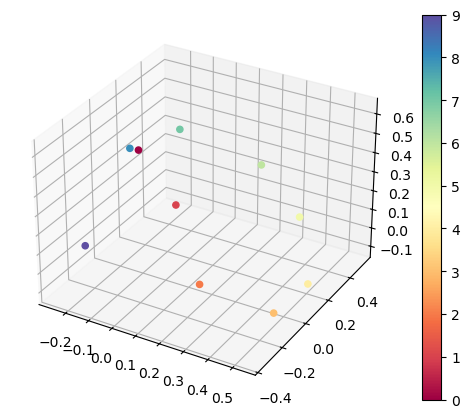

In [17]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)

# pca.fit(cache['resid_post', 0][:,13,:].cpu().numpy())
digit_list = []
for d in range(config['ary']):
    digit_list.append(encode(str(d))[0])
pca.fit(model.W_E[digit_list, :].detach().cpu().numpy().T)

ax = plt.figure(figsize=(7,5)).add_subplot(111, projection='3d')
m = ax.scatter(pca.components_[0], pca.components_[1], pca.components_[2], c=range(config['ary']), cmap='Spectral', alpha=1)
plt.colorbar(m, ax=ax)


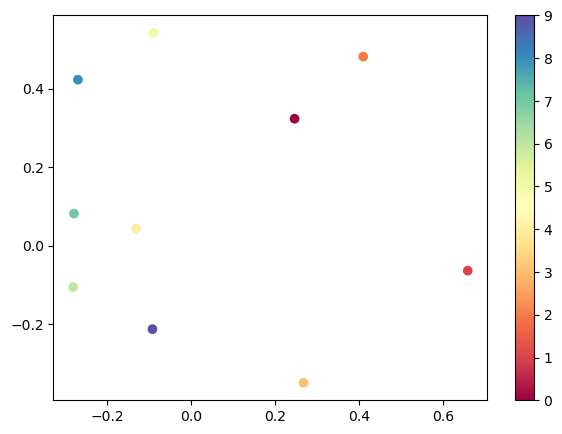

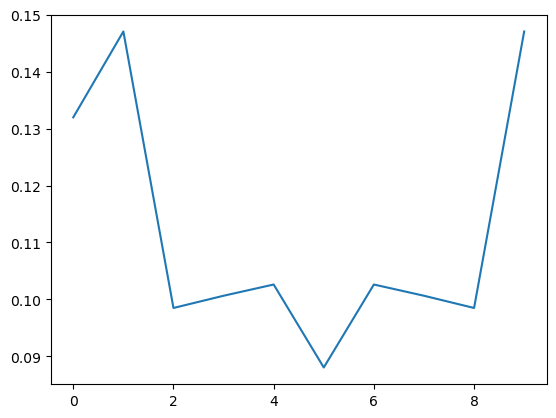

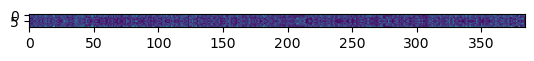

In [71]:
import numpy as np

digit_embs = model.W_E[digit_list, :].detach().cpu().numpy()
W_V = model.W_V[2, 1, :, :].detach().cpu().numpy()
pca.fit((digit_embs @ W_V).T)

ax = plt.figure(figsize=(7,5)).add_subplot(111)
m = ax.scatter(pca.components_[0], pca.components_[1], c=range(config['ary']), cmap='Spectral', alpha=1)
plt.colorbar(m, ax=ax)

plt.figure()
fft = np.fft.fftn(digit_embs, axes=[0])
plt.plot(np.abs(fft).mean(1))

plt.figure()
plt.imshow(np.abs(fft))


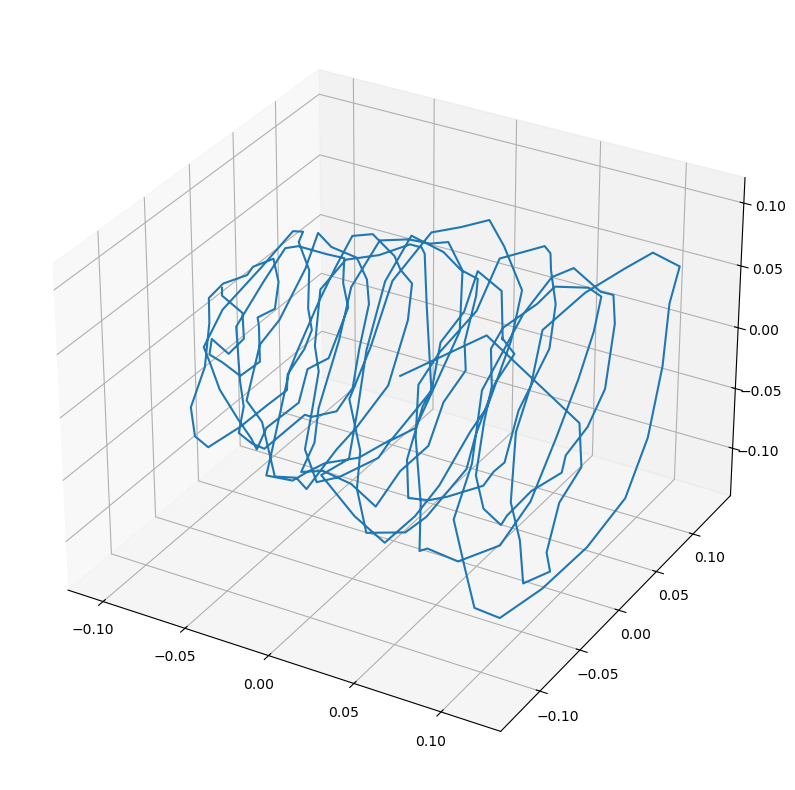

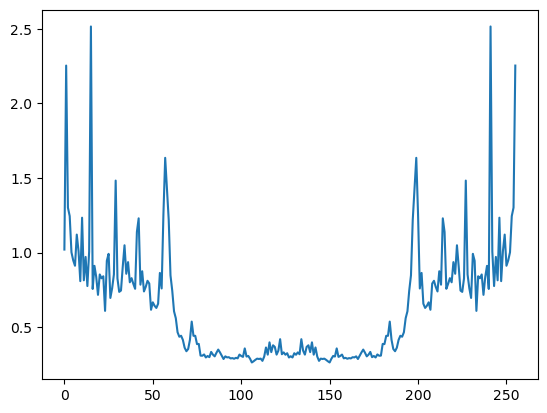

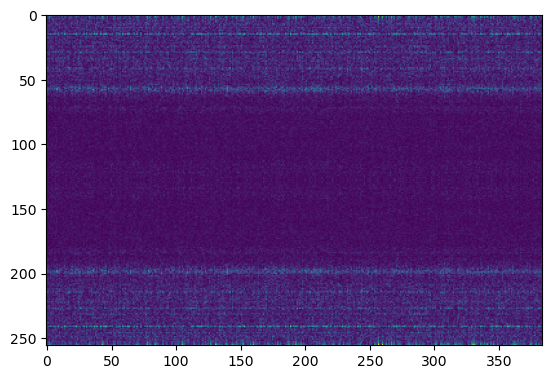

In [68]:
import numpy as np
# position embedding PCA

pca = PCA(n_components=10)
pos_embs = model.W_pos.detach().cpu().T
pos_embs /= pos_embs.norm(dim=0)
pca.fit(pos_embs)
plt.figure(figsize=(10, 10)).add_subplot(111, projection='3d')
plt.plot(pca.components_[0], pca.components_[1], pca.components_[2])

plt.figure()
fft = np.fft.fftn(model.W_pos.detach().cpu(), axes=[0])
plt.plot(np.abs(fft).mean(1))

plt.figure()
plt.imshow(np.abs(fft))


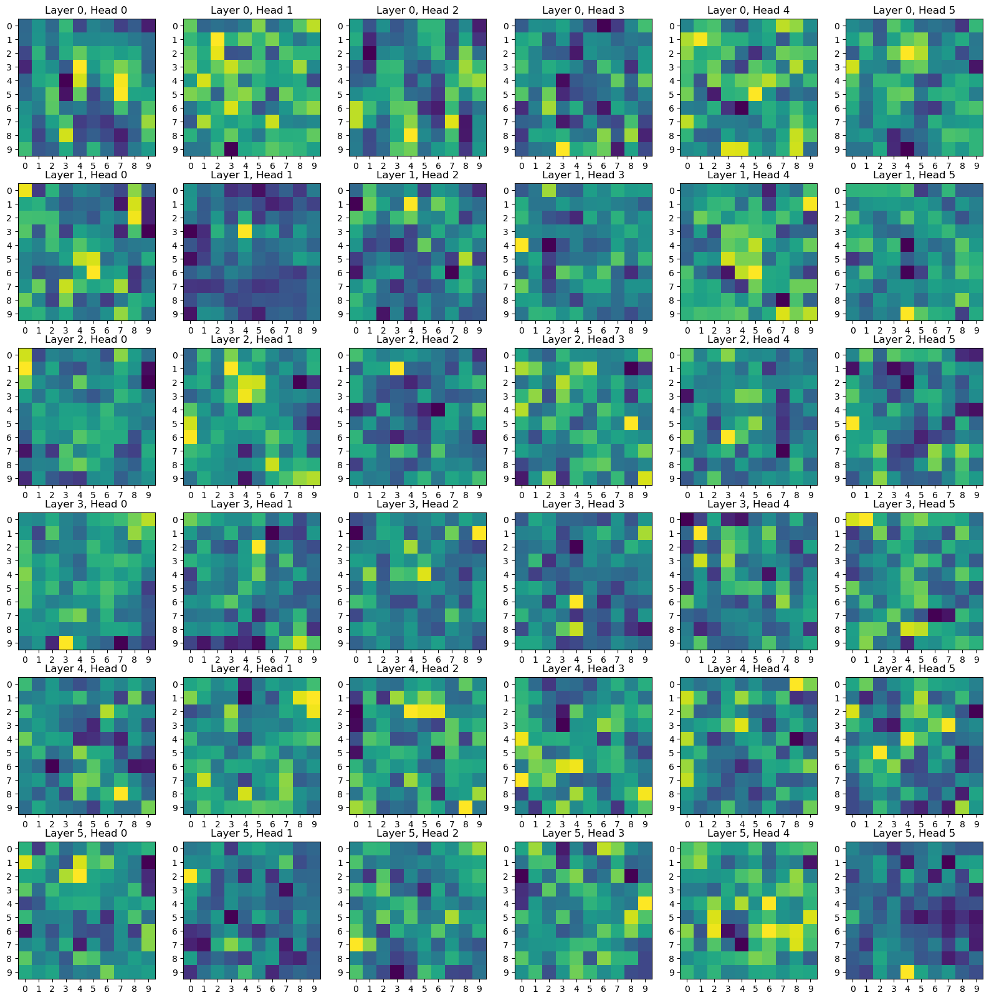

In [19]:
import numpy as np

f, axs = plt.subplots(model.cfg.n_layers, model.cfg.n_heads, figsize=(20, 20))

for layer in range(model.cfg.n_layers):
    for head in range(model.cfg.n_heads):
        W_V = model.W_V[layer, head].detach().cpu().numpy()
        W_E = model.W_E.detach().cpu().numpy()
        # print(W_E.shape, W_V.T.shape, (W_E.T)[:W_V.shape[1]].shape)
        # print(np.linalg.pinv(W_E).shape)
        W_V_emb = W_E @ W_V @ (W_E.T)[:W_V.shape[1]]

        zero_id = encode('0')[0]
        nine_id = encode('9')[0]
        W_V_emb = W_V_emb[zero_id:nine_id+1, zero_id:nine_id+1]

        # print(W_V_emb.shape)
        axs[layer, head].imshow(W_V_emb)
        axs[layer, head].set_title(f'Layer {layer}, Head {head}')
        axs[layer, head].set_xticks(range(10), range(10))
        axs[layer, head].set_yticks(range(10), range(10))


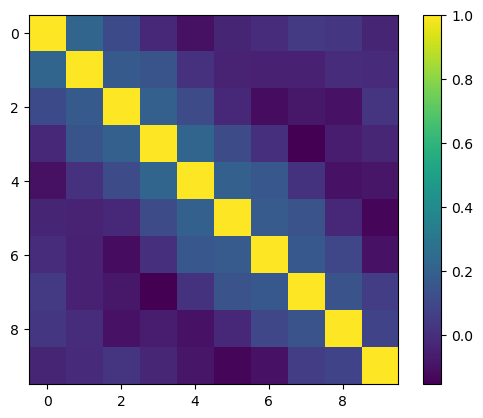

<BarContainer object of 10 artists>

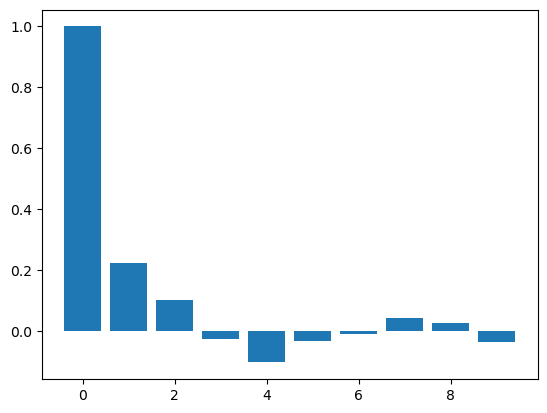

In [20]:
# each embedding should be nearly orthogonal to each other

embs = model.W_E[digit_list, :].detach()
embs /= embs.norm(dim=1, keepdim=True)
gram = t.einsum('ij,kj->ik', embs, embs).cpu().numpy()
plt.imshow(gram)
plt.colorbar()
plt.show()

plt.figure()
plt.bar(range(len(gram)), gram[0])


=11999


100%|██████████| 8/8 [00:00<00:00, 90.72it/s]


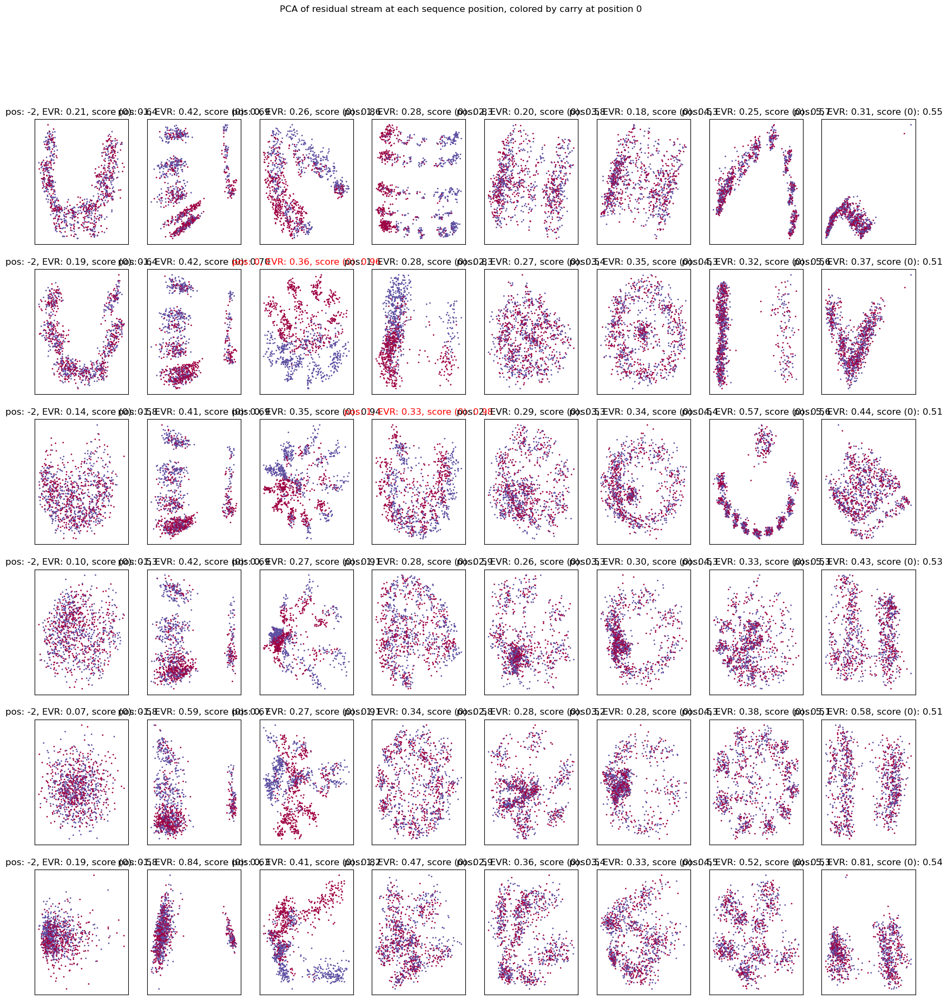

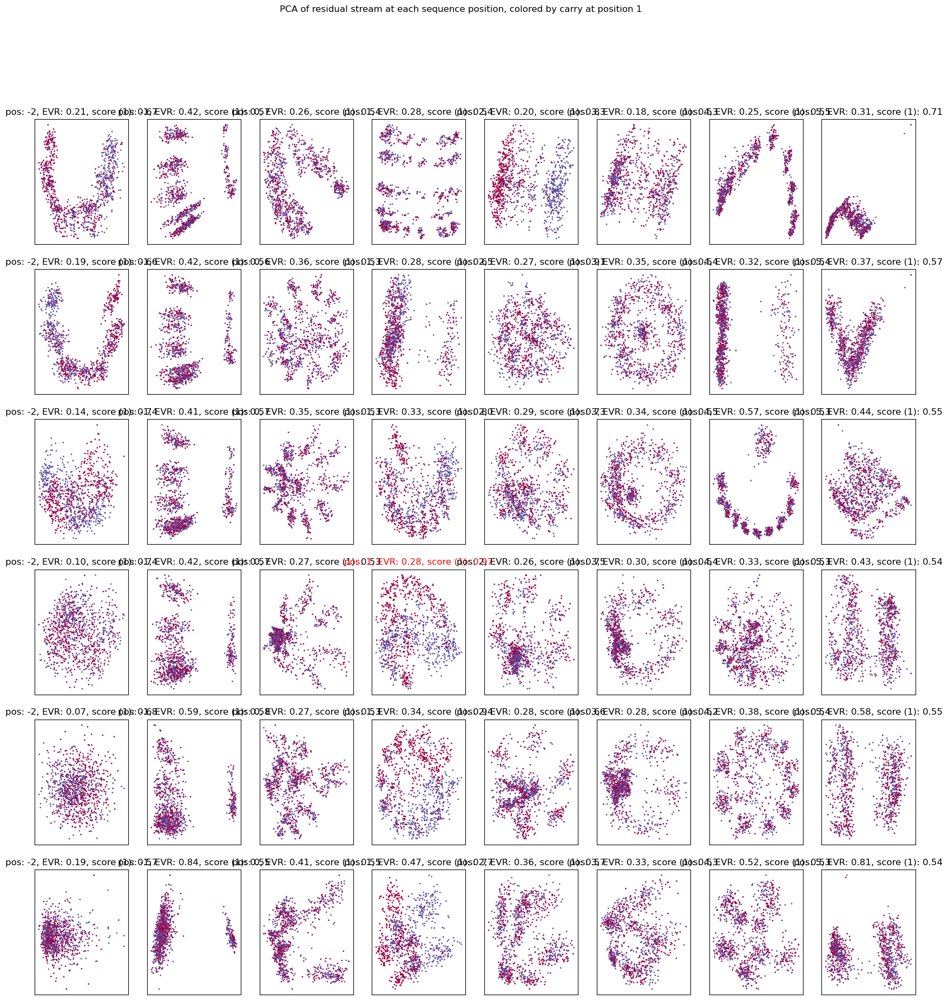

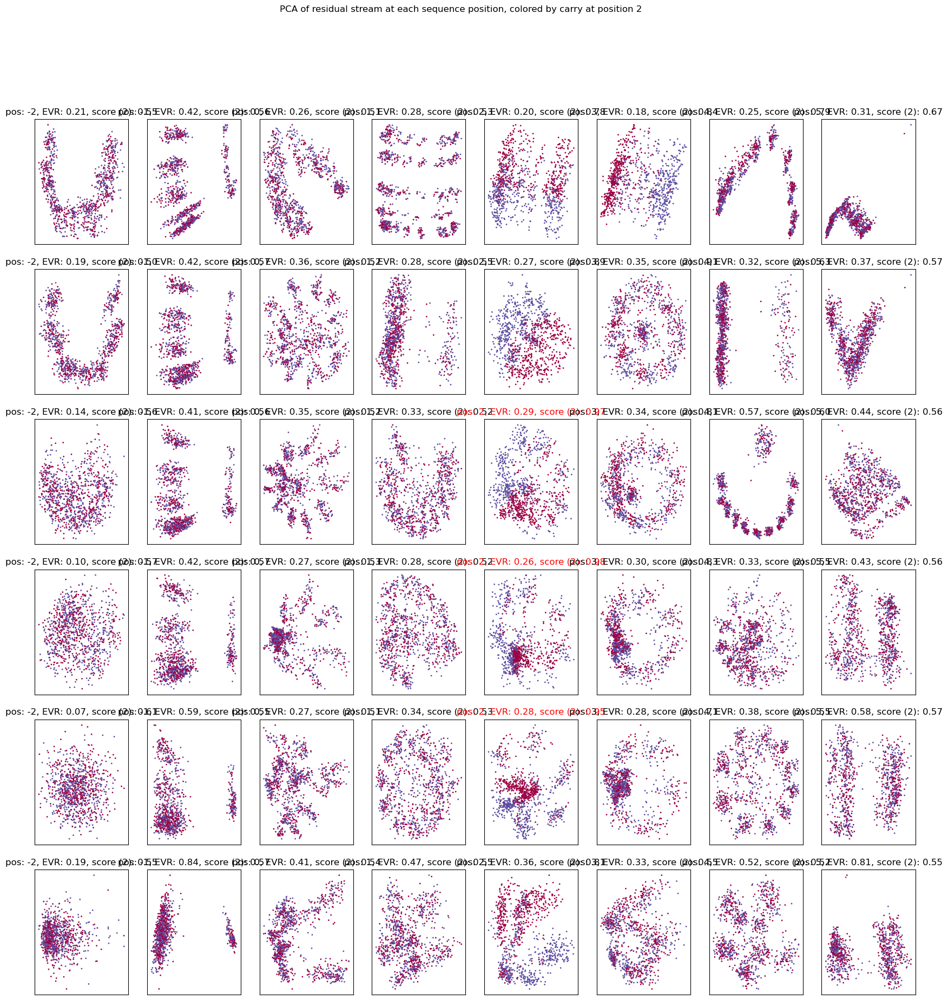

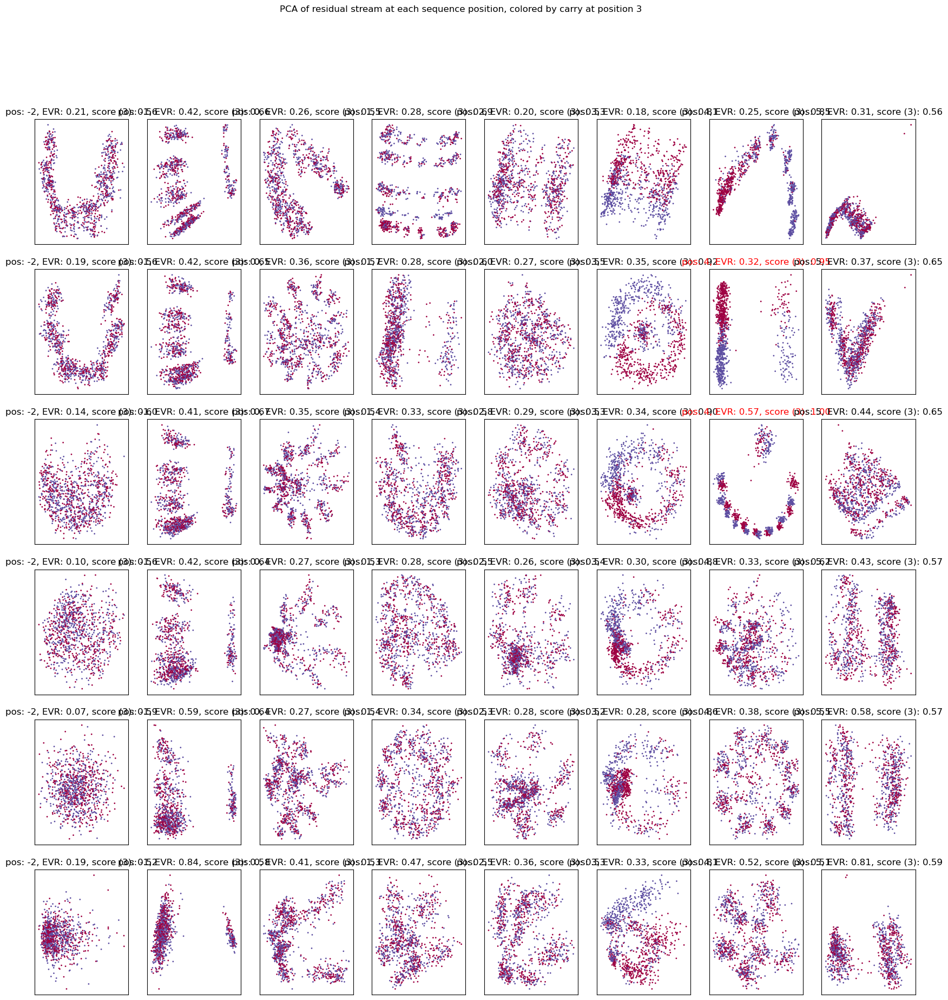

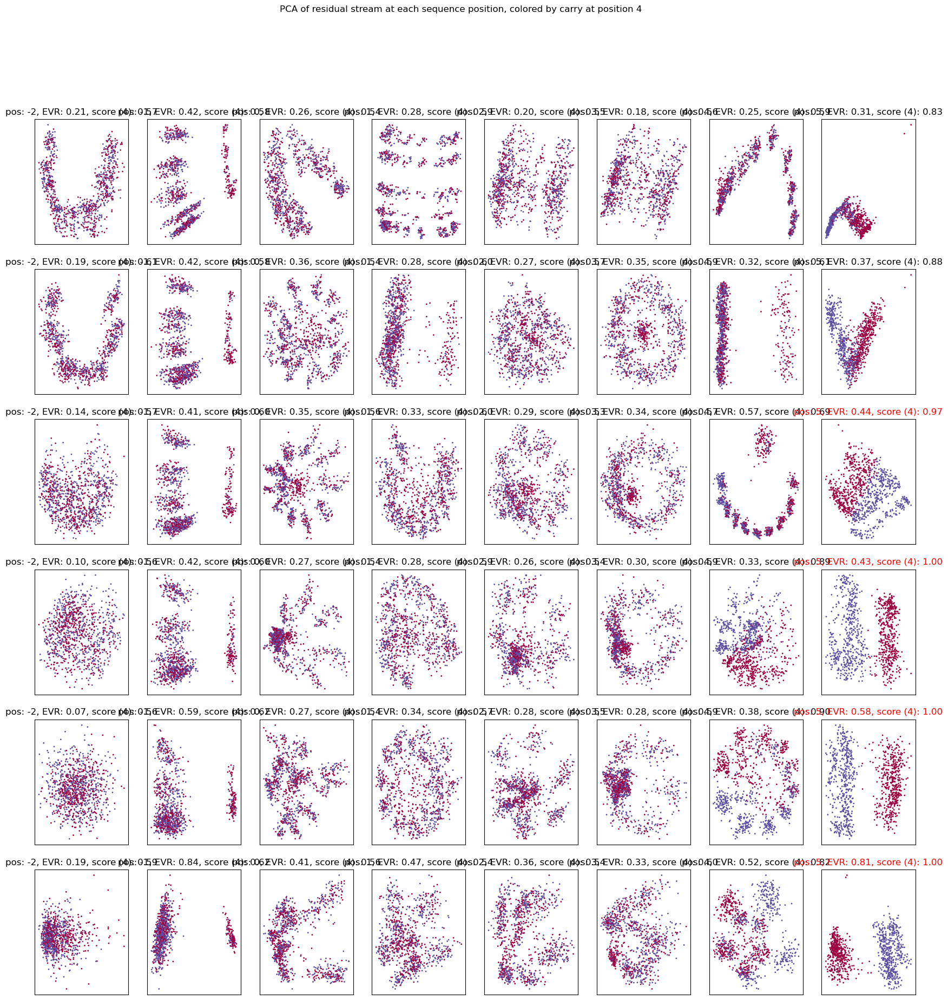

In [22]:
import umap
from sklearn.linear_model import LogisticRegression

# disable convergence warning
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter("ignore", ConvergenceWarning)

print(decode(test_dataset['line'][0][eq_pos: eq_pos + config['n_digit']+1].cpu().numpy()))

# set up the figure
pca = PCA(n_components=6)
for carry_pos in range(config['n_digit']):
    f, axs = plt.subplots(model.cfg.n_layers, config['n_digit']+3, figsize=(model.cfg.n_layers * 3.5, (config['n_digit']+1) * 3.5))

    for target_layer in range(model.cfg.n_layers):
        for pos in tqdm(range(eq_pos-2, eq_pos + config['n_digit']+1)):
            # ax = axs[pos//4, pos%4]
            ax = axs[target_layer, pos-eq_pos+2]
            if pos < line_len:
                X = cache['resid_post', target_layer]
                # X = cache['embed']
                X = X[:, pos].cpu().numpy()

                # embedding = umap.UMAP().fit_transform(X)
                pca.fit(X)
                embedding = pca.transform(X)
                classes = t.where(test_dataset['carries'][:, carry_pos] == 1, 1, 0).cpu().numpy()
                # classes = carries.cpu().numpy()
                p=ax.scatter(embedding[:,0], embedding[:,1], cmap='Spectral', c=classes, s=1, alpha=1)

                # probe whether residual stream at (position, layer) can separate the carries at carry_pos
                if len(set(classes)) > 1:
                    lr = LogisticRegression(random_state=0, max_iter=50, verbose=False)
                    lr.fit(embedding, classes)
                    score = lr.score(embedding, classes)
                else:
                    score = 1
                
                ax.set_title(f'pos: {pos - eq_pos}, EVR: {pca.explained_variance_ratio_[:2].sum():.2f}, score ({carry_pos}): {score:.2f}', fontdict={'color': 'r' if score > 0.95 else 'k'})
            plt.setp(ax, xticks=[], yticks=[])

    plt.suptitle(f'PCA of residual stream at each sequence position, colored by carry at position {carry_pos}')

    len_carries = len(set(carries.cpu().numpy()))
    # cbar = f.colorbar(p, boundaries=np.arange(len_carries+1)-0.5, ax=axs)
    # cbar.set_ticks(np.arange(len_carries))


torch.Size([8100, 16])


8it [00:06,  1.27it/s]


torch.Size([8100, 16, 384])


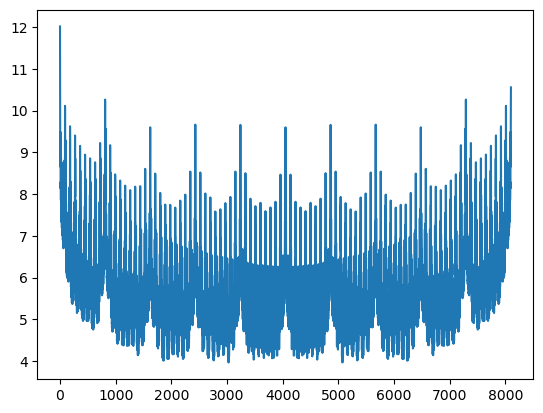

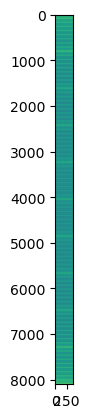

In [29]:
from tqdm import tqdm
from transformer_lens import ActivationCache
from matplotlib import pyplot as plt
import numpy as np

sorted_test_lines = t.tensor([
    encode(f'${a}+{b}={a+b}'.rjust(16, '#')) for a in range(1000, 9999, 100) for b in range(1000, 9999, 100)
])
print(sorted_test_lines.shape)

target_pos = 8
target_layer = 1

cache_dict = {}
with t.no_grad():
    for bid, _ in tqdm(enumerate(range(sorted_test_lines.shape[0] // config['eval_batch_size']+1))):
        test_input = sorted_test_lines[bid * config['eval_batch_size']:(bid + 1) * config['eval_batch_size']]
        logits, cache = model.run_with_cache(test_input, attention_mask=None, return_type='logits', pad_token_id=pad_token_id)
        cache.to('cpu')
        for key, value in cache.items():
            if key not in cache_dict:
                cache_dict[key] = [value]
            else:
                cache_dict[key] += [value]

for key, value in cache_dict.items():
    cache_dict[key] = t.cat(value, dim=0)
cache = ActivationCache(cache_dict, model)

print(cache['resid_post', 0].shape)
X = cache['resid_post', target_layer]
X = X[:, target_pos].cpu().numpy()

plt.figure()
fft = np.fft.fftn(X)
plt.plot(np.log(np.abs(fft).mean(1)))

plt.figure()
plt.imshow(np.log(np.abs(fft)))


In [92]:
x = [(1,9), (5,4), (1,0), (4,4), (3,0), (4,2), (4,1)]
np.argsort(x) # or np.argsort(x, order=('x', 'y'))

array([[0, 1],
       [1, 0],
       [1, 0],
       [0, 1],
       [1, 0],
       [1, 0],
       [1, 0]])

In [24]:
pca = PCA(n_components=4)

scores = t.zeros((config['n_digit'], config['n_layer']+1, line_len-3))
for carry_pos in range(config['n_digit']):
    for target_layer in range(-1, config['n_layer']):
        print(f'carry_pos: {carry_pos}, target_layer: {target_layer}')
        for pos in range(eq_pos, eq_pos+carry_pos+1):
            if pos < line_len:
                # aligned_pos = pos + eq_pos - min(eq_pos)
                # valid_pos = (0 <= aligned_pos) & (aligned_pos < line_len)
                # data_idx = t.arange(len(eq_pos))
                # data_idx = data_idx[valid_pos]
                # aligned_pos = aligned_pos[valid_pos]
                # X = cache['mlp_out', target_layer]
                # X = X[data_idx, aligned_pos].cpu().numpy()
                if target_layer == -1:
                    X = cache['resid_pre', 0][:, pos].cpu().numpy()
                else:
                    X = cache['resid_post', target_layer][:, pos].cpu().numpy()
                pca.fit(X)
                embedding = pca.transform(X)
                # classes = t.where(test_dataset['carries'][valid_pos][:, carry_pos] == 1, 1, 0).cpu().numpy()
                classes = t.where(test_dataset['carries'][:, carry_pos] == 1, 1, 0).cpu().numpy()
                # classes = carries.cpu().numpy()
                # probe whether residual stream at (position, layer) can separate the carries at carry_pos
                if len(set(classes)) > 1:
                    lr = LogisticRegression(random_state=0, max_iter=50, verbose=False)
                    lr.fit(embedding, classes)
                    scores[carry_pos, target_layer+1, pos] = lr.score(embedding, classes)
                    print(f'pos: {pos}, score: {scores[carry_pos, target_layer+1, pos]}')
                else:
                    scores[carry_pos, target_layer+1, pos] = 0
        

carry_pos: 0, target_layer: -1
pos: 12, score: 0.5040000081062317
carry_pos: 0, target_layer: 0
pos: 12, score: 0.7839999794960022
carry_pos: 0, target_layer: 1
pos: 12, score: 0.8999999761581421
carry_pos: 0, target_layer: 2
pos: 12, score: 0.9340000152587891
carry_pos: 0, target_layer: 3
pos: 12, score: 0.8849999904632568
carry_pos: 0, target_layer: 4
pos: 12, score: 0.8479999899864197
carry_pos: 0, target_layer: 5
pos: 12, score: 0.8180000185966492
carry_pos: 1, target_layer: -1
pos: 12, score: 0.5040000081062317
pos: 13, score: 0.5440000295639038
carry_pos: 1, target_layer: 0
pos: 12, score: 0.527999997138977
pos: 13, score: 0.531000018119812
carry_pos: 1, target_layer: 1
pos: 12, score: 0.5329999923706055
pos: 13, score: 0.6430000066757202
carry_pos: 1, target_layer: 2
pos: 12, score: 0.5389999747276306
pos: 13, score: 0.7979999780654907
carry_pos: 1, target_layer: 3
pos: 12, score: 0.5299999713897705
pos: 13, score: 0.9160000085830688
carry_pos: 1, target_layer: 4
pos: 12, score:

torch.Size([5, 7, 18])


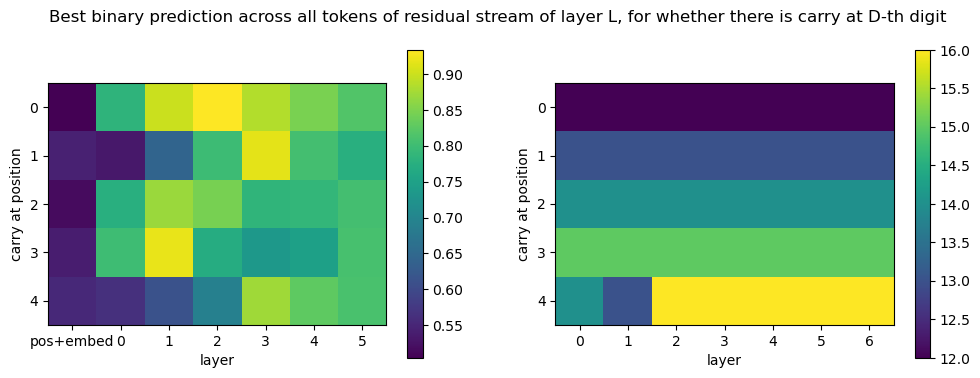

<Figure size 640x480 with 0 Axes>

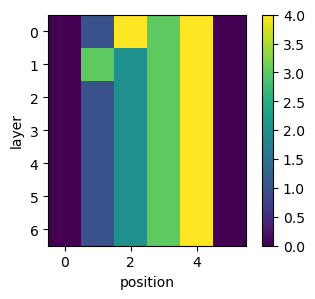

In [25]:
from collections import Counter

f, axs = plt.subplots(1, 2, figsize=(12, 4))
p1 = axs[0].imshow(scores.max(-1)[0])
axs[0].set_xlabel('layer')
axs[0].set_xticks(range(config['n_layer']+1), ['pos+embed'] + list(range(config['n_layer'])))
axs[0].set_ylabel('carry at position')
plt.colorbar(p1, ax=axs[0])
p2 = axs[1].imshow(scores.max(-1)[1])
plt.colorbar(p2, ax=axs[1])
plt.xlabel('layer')
plt.ylabel('carry at position')


plt.suptitle('Best binary prediction across all tokens of residual stream of layer L, for whether there is carry at D-th digit')
# print(Counter(t.where(test_dataset['carries'][valid_pos][:, carry_pos] == 1, 1, 0).cpu().numpy()))
# carry_pos = 7
# target_layer = 3
# pos = 0
# for pos in tqdm(range(0, H * 4)):
#     if pos < line_len:
#         pca = PCA(n_components=3)
#         aligned_pos = pos + eq_pos - min(eq_pos)
#         valid_pos = (0 <= aligned_pos) & (aligned_pos < line_len)
#         data_idx = t.arange(len(eq_pos))
#         data_idx = data_idx[valid_pos]
#         aligned_pos = aligned_pos[valid_pos]
#         X = cache['pos_embed']
#         X = X[data_idx, aligned_pos].cpu().numpy()
#         pca.fit(X)
#         embedding = pca.transform(X)
#         classes = t.where(test_dataset['carries'][valid_pos][:, carry_pos] == 1, 1, 0).cpu().numpy()
#         # probe whether residual stream at (position, layer) can separate the carries at carry_pos
#         if len(set(classes)) > 1:
#             lr = LogisticRegression(random_state=0, max_iter=50, verbose=False)
#             lr.fit(embedding, classes)
#             print(lr.score(embedding, classes))
#         else:
#             print('only one class')

print(scores.shape)
plt.figure()
f, axs = plt.subplots(1, 1, figsize=(4, 3))
p1 = axs.imshow(scores.max(0)[1][:,eq_pos:])
axs.set_xlabel('position')
axs.set_ylabel('layer')
plt.colorbar(p1, ax=axs)

# p2 = axs[1].imshow(scores.max(1)[1], vmin=0, vmax=config['n_digit'])
# plt.colorbar(p2, ax=axs[1])
# plt.xlabel('position')
# plt.ylabel('layer')



=1199


  0%|          | 0/6 [00:00<?, ?it/s]

100%|██████████| 6/6 [00:00<00:00, 26.26it/s]


Text(0.5, 1.0, 'Apply Unembed to residual stream at (position, layer) to predict next token')

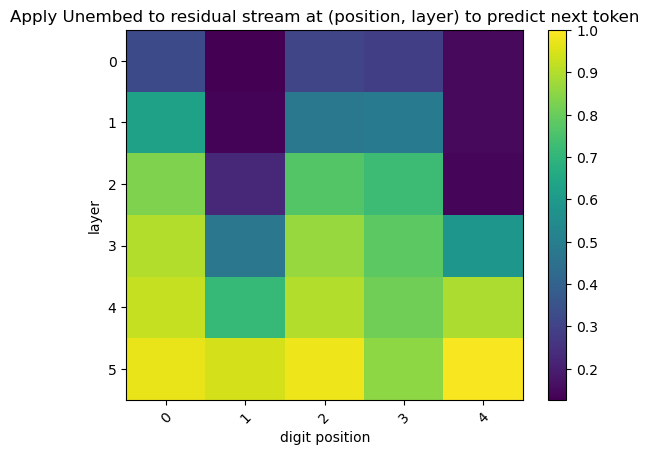

In [26]:
def linear_probe_eval(cache: ActivationCache, model: HookedTransformer, test_lines, layer, pos):
    X = cache['resid_post', layer]
    X = cache.apply_ln_to_stack(X, layer)[:, pos, :]
    # # X = X[:, pos]
    y_hat = t.argmax(X @ model.W_U.detach().cpu() + model.b_U.detach().cpu(), dim=-1).cpu().numpy()
    # y_hat = t.argmax(logits[:, pos], dim=-1).cpu().numpy()
    y = test_lines[:, pos+1].cpu().numpy()
    # y = np.random.randint(0, 2, len(test_lines))
    # print(pos, set(y))
    # if len(set(y)) <= 1:
    #     return 1
    # lr = LogisticRegression(random_state=0, max_iter=50, verbose=False)
    # lr.fit(X, y)
    # return lr.score(X, y)
    return np.mean(y == y_hat)

print(decode(test_dataset['line'][0][eq_pos: eq_pos + config['n_digit']].cpu().numpy()))
# print(decode(test_dataloader))

scores = np.zeros((model.cfg.n_layers, config['n_digit']))
for layer in tqdm(range(model.cfg.n_layers)):
    for position in range(eq_pos, eq_pos + config['n_digit']):
        scores[layer, position-eq_pos] = linear_probe_eval(cache, model, test_dataset['line'], layer, position)

# scores = np.zeros((model.cfg.n_layers, line_len-1))
# for layer in tqdm(range(model.cfg.n_layers)):
#     for position in range(line_len-1):
#         scores[layer, position] = linear_probe_eval(cache, model, test_dataset['line'], layer, position)

plt.imshow(scores, aspect='auto', vmax=1)
plt.colorbar()
plt.xticks(range(config['n_digit']), rotation=45)
plt.xlabel('digit position')
plt.yticks(range(model.cfg.n_layers))
plt.ylabel('layer')
plt.title('Apply Unembed to residual stream at (position, layer) to predict next token')


  0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


['=', '2', '2', '2', '3']


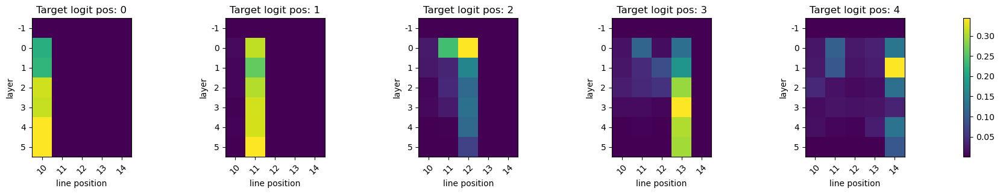

<Figure size 640x480 with 0 Axes>

In [ ]:
def corrupt_position_hook(activation, hook, layer, pos, cache):
    activation[:, pos] = cache[hook.name][:, pos]
    # activation[:, pos] = 0
    return activation

def compute_logit_diff(logits: t.Tensor, new_logits: t.Tensor, pos_slice=slice(eq_pos, eq_pos+config['n_digit']+1)):
    return t.abs(logits - new_logits)[:, pos_slice, :].mean(dim=0).mean(dim=-1).cpu().numpy()
    # print(decode(logits.argmax(-1)[0, pos_slice].cpu().numpy()), decode(new_logits.argmax(-1)[0, pos_slice].cpu().numpy()))
    # return t.count_nonzero((logits.argmax(-1) != new_logits.argmax(-1))[:, pos_slice], dim=0).cpu().numpy()

scores = np.zeros((model.cfg.n_layers + 1, line_len-1, config['n_digit']+1))
# target_carry = 0
# test_input = test_dataset['line'][carries == target_carry]
# test_input = test_dataset['line'][test_dataset['carries'][:, target_carry] == 0][:128]
test_input = t.tensor(encode('$2447+1998=5444$\n')).unsqueeze(0)
# test_input = t.tensor(encode('###$1111+8889=00001$\n')).unsqueeze(0)
# print(decode(test_input[0].cpu().numpy()))
# original_carry = 0
# base_input = test_dataset['line'][carries == original_carry]
# base_input = test_dataset['line'][test_dataset['carries'][:, original_carry] == 1][:128]
base_input = t.tensor(encode('$2443+2002=5444$\n')).unsqueeze(0)
# base_input = t.tensor(encode('$1441+3004=4445$\n')).unsqueeze(0)
# base_input = t.tensor(encode('###$1111+8888=00001$\n')).unsqueeze(0)
# print(decode(base_input[0].cpu().numpy()))

line_start = 0
with t.no_grad():
    for layer in tqdm(range(-1, model.cfg.n_layers)):
        for position in range(line_start, line_len-1):
            if layer == -1:
                act_name = get_act_name('resid_pre', 0)
            else:
                act_name = get_act_name('resid_post', layer)
            _, cache2 = model.run_with_cache(base_input.to(device), return_type='logits', names_filter=act_name, pad_token_id=pad_token_id)
            hook_fn = partial(corrupt_position_hook, layer=layer, pos=position, cache=cache2)
            old_logits = model(test_input.to(device), return_type='logits', pad_token_id=pad_token_id)
            # print(decode(old_logits.argmax(-1).squeeze().cpu().numpy()))
            model.remove_all_hook_fns() # might not need
            new_logits = model.run_with_hooks(test_input.to(device), fwd_hooks=[(act_name, hook_fn)], return_type='logits', pad_token_id=pad_token_id)
            # print(decode(new_logits.argmax(-1).squeeze().cpu().numpy()))
            scores[layer+1, position-line_start, :] = compute_logit_diff(old_logits.detach().cpu(), new_logits.detach().cpu()) # consider each logit position separately

fig, axs = plt.subplots(1, config['n_digit']+1, figsize=((config['n_digit']+1)*5, 3))

# print(scores)
plt.figure()
print(list('$1111+1112=2223$\n')[eq_pos: eq_pos+config['n_digit']+1])
for i in range(config['n_digit']+1):
    p = axs[i].imshow(scores[:, eq_pos: eq_pos+config['n_digit']+1, i])
    axs[i].set_xticks(range(config['n_digit']+1))
    axs[i].set_xticklabels(range(eq_pos, eq_pos+config['n_digit']+1), rotation=45)
    axs[i].set_xlabel('line position')
    axs[i].set_yticks(range(model.cfg.n_layers+1), list(range(-1, model.cfg.n_layers)))
    axs[i].set_ylabel('layer')
    axs[i].set_title(f'Target logit pos: {i}')

plt.colorbar(p, ax=axs) 
plt.suptitle('Absolute difference in logit values after corrupting each position in the input line, for each layer')
plt.show()


=5444$


  0%|          | 0/6 [00:00<?, ?it/s]

100%|██████████| 6/6 [00:00<00:00, 32.69it/s]


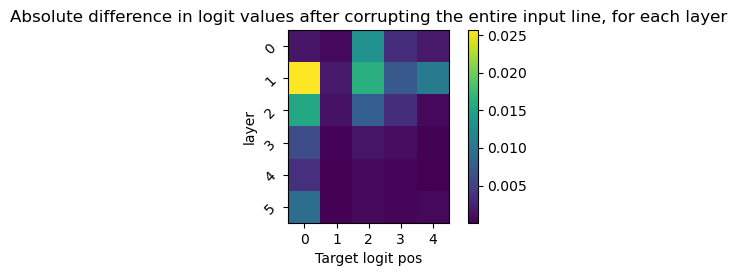

In [ ]:
def corrupt_line_hook(activation, hook, layer, cache):
    activation[:, eq_pos, eq_pos+config['n_digit']+1] = cache[hook.name][:, eq_pos, eq_pos+config['n_digit']+1]
    # activation = cache[hook.name]
    # activation[:] = 0
    return activation

def compute_logit_diff(logits: t.Tensor, new_logits: t.Tensor, pos_slice=slice(eq_pos, eq_pos+config['n_digit'] + 1)):
    return t.abs(logits - new_logits)[:, pos_slice, :].mean(dim=0).mean(dim=-1).cpu().numpy()

scores = np.zeros((model.cfg.n_layers, config['n_digit']+1))
# target_carry = 15
# test_input = test_dataset['line'][carries == target_carry]
test_input = t.tensor(encode('###$2447+1998=5444$\n')).unsqueeze(0)
# print(decode(test_input[0].cpu().numpy()))
# original_carry = 0
# base_input = test_dataset['line'][carries == original_carry]
base_input = t.tensor(encode('###$2403+2042=5444$\n')).unsqueeze(0)
print(decode(base_input[0].cpu().numpy()[13:19]))

line_start = 0
with t.no_grad():
    for layer in tqdm(range(model.cfg.n_layers)):
        act_name = get_act_name('resid_pre', layer)
        _, cache2 = model.run_with_cache(base_input.to(device), return_type='logits', names_filter=act_name, pad_token_id=pad_token_id)
        hook_fn = partial(corrupt_line_hook, layer=layer, cache=cache2)
        old_logits = model(test_input.to(device), return_type='logits', pad_token_id=pad_token_id)
        model.remove_all_hook_fns() # might not need
        new_logits = model.run_with_hooks(test_input.to(device), fwd_hooks=[(act_name, hook_fn)], return_type='logits', pad_token_id=pad_token_id)
        scores[layer, :] = compute_logit_diff(old_logits.detach().cpu(), new_logits.detach().cpu()) # consider each logit position separately

f, ax = plt.subplots(1, 1, figsize=(5, 2.5))
i = 0
axs = [ax]

p = axs[i].imshow(scores)
axs[i].set_yticks(range(model.cfg.n_layers))
axs[i].set_yticklabels(range(model.cfg.n_layers), rotation=45)
axs[i].set_ylabel('layer')
axs[i].set_xticks(range(config['n_digit']+1))
axs[i].set_xlabel('Target logit pos')

plt.colorbar(p, ax=axs)
plt.title('Absolute difference in logit values after corrupting the entire input line, for each layer')
plt.show()
